In [81]:
from pathlib import Path
import numpy as np
import torch
import torch.nn.functional as F
from PIL import Image
from matplotlib import pyplot as plt

from dataset import get_dataloaders_supervised
from iou import iou_global
from plot_samples import plot_first_n
from unet import Unet, SkipType
from parse_stats import parse_stats_and_plot

device = 'cuda'
model = Unet(layers=[8, 16, 32, 64, 128], output_channels=11).to(device)

_, dataloader_train, _, dataloader_test = get_dataloaders_supervised()

def plot_five(model_name, calc_iou=True, mode='train'):
    model.load_state_dict(torch.load(model_name, map_location=device))

    plot_first_n(model, dataloader_test if mode == 'test' else dataloader_train, 5, 'show', device=device, calc_iou=calc_iou)

def calc_loss(model_name):
    model.load_state_dict(torch.load(model_name, map_location=device))

    def criterion(x, mask):
        x = torch.sigmoid(x)
        result = F.binary_cross_entropy(x, mask.float())

        return result

    losses = []
    for img, mask in dataloader_test:
        img, mask = img.to(device), mask.to(device)
        losses.append(criterion(model(img), mask).item())

    return np.mean(np.array(losses))

# Segmentation no transfer with skips

## Loss

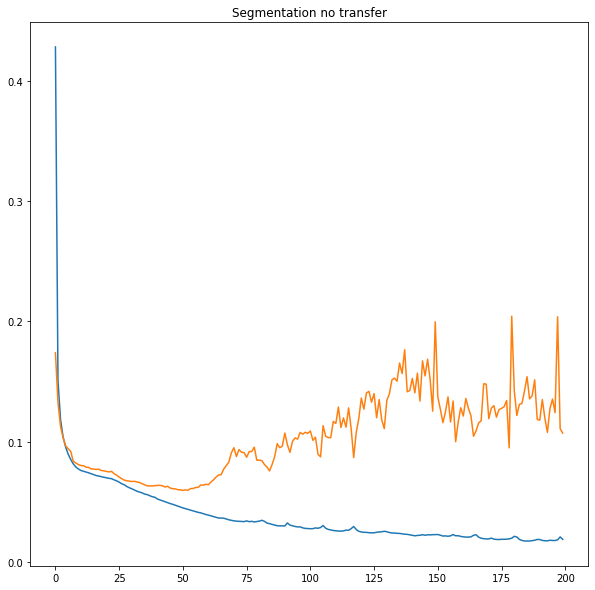

In [82]:
plt.figure(figsize=[10, 10])
plt.title('Segmentation no transfer')
parse_stats_and_plot(str(Path() / 'logs' / 'no_transfer' / '200epochs_1e-4.out'))
plt.show()

## Plot train

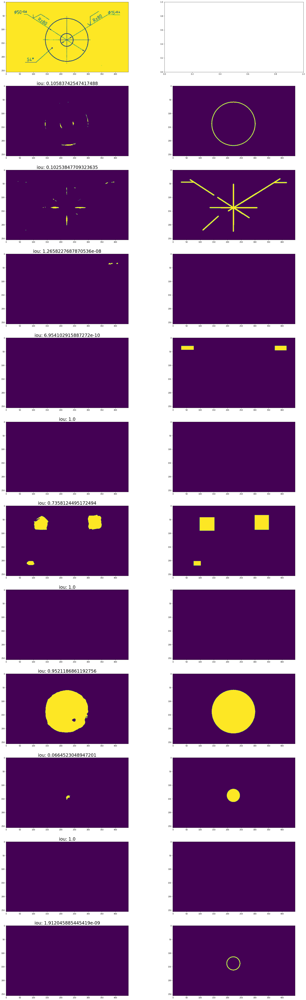

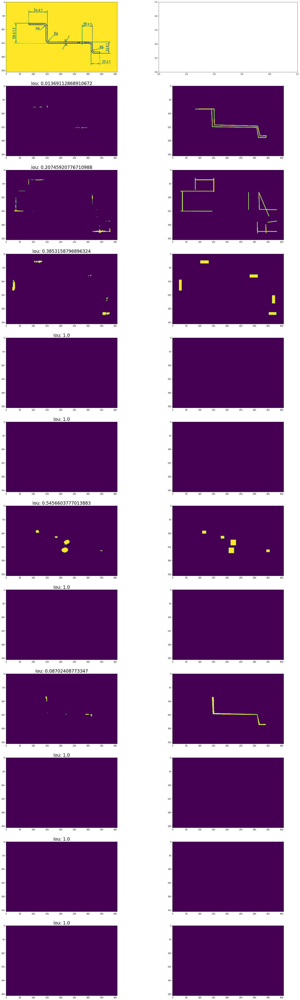

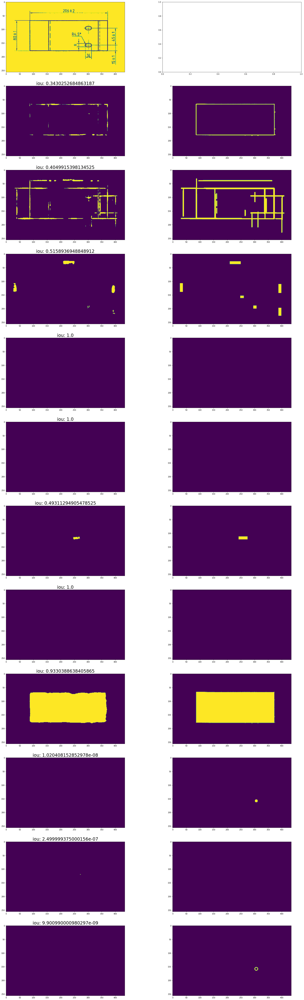

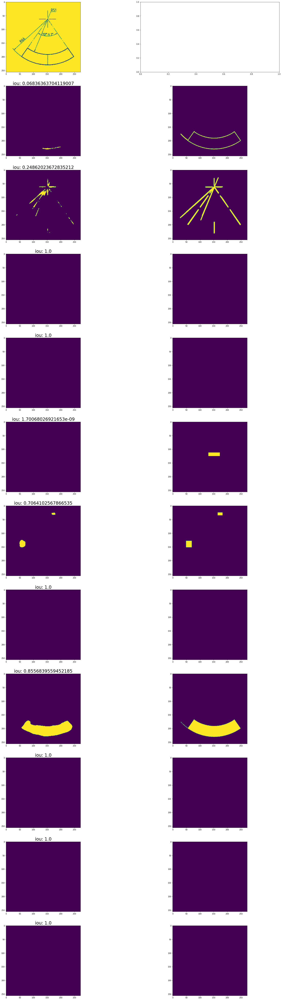

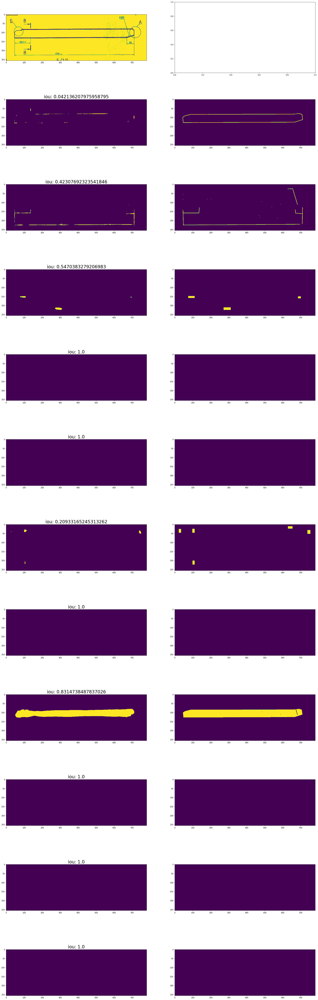

In [83]:
plot_five('learned_models/no_transfer/200epochs_1e-4.pt', calc_iou=True, mode='train')

## Plot test

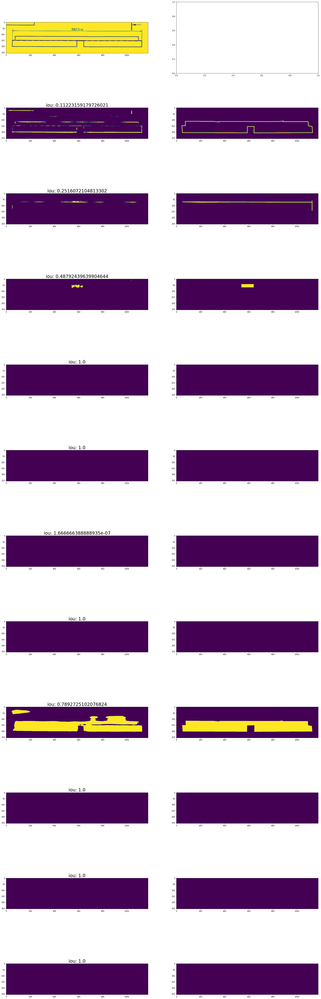

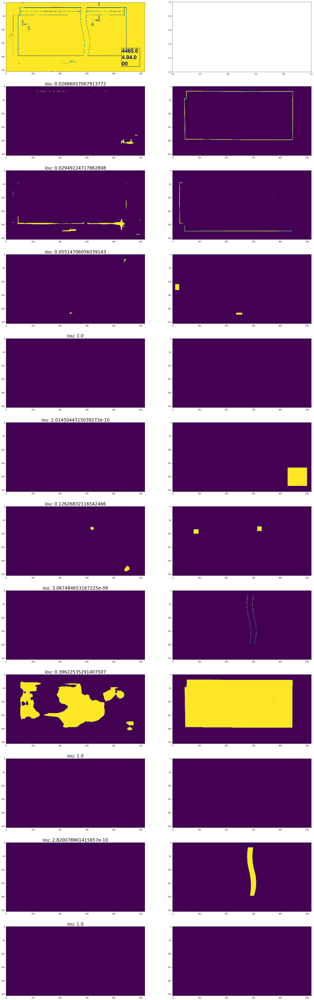

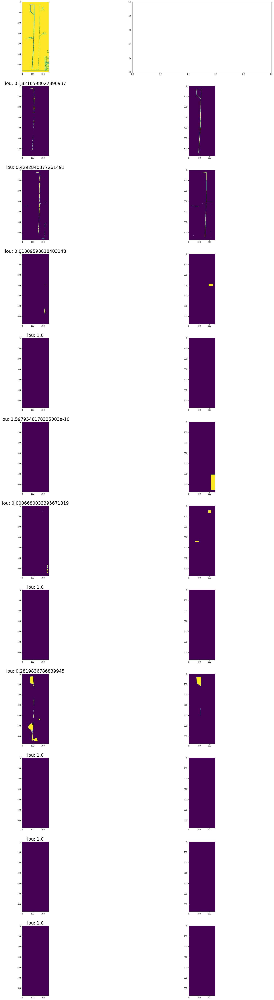

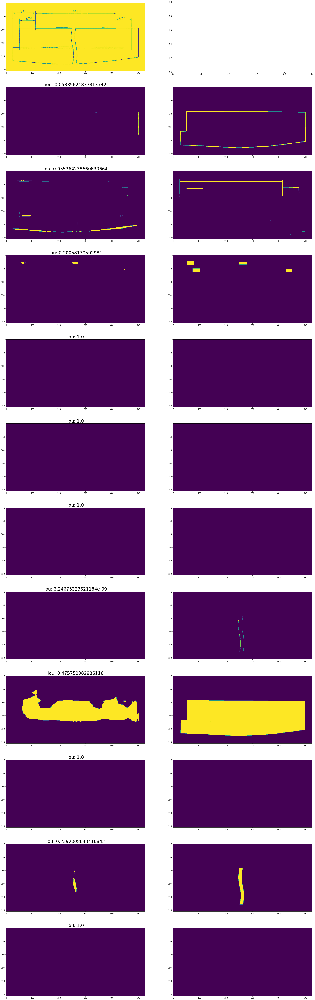

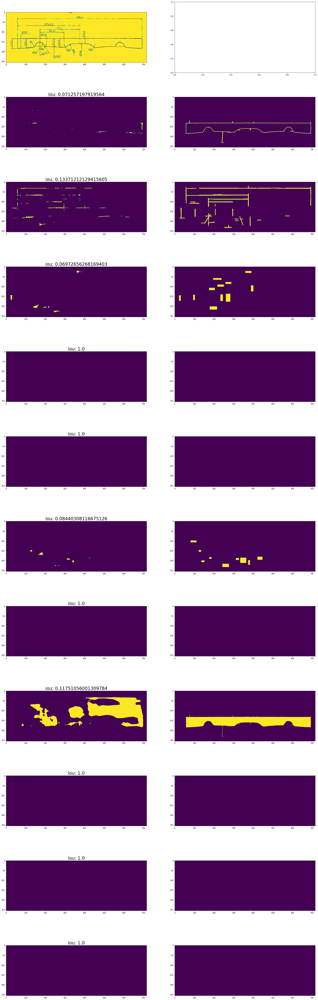

In [84]:
plot_five('learned_models/no_transfer/200epochs_1e-4.pt', calc_iou=True, mode='test')

## IOU train

In [85]:
iou_global(dataloader=dataloader_train, model=model, device=device)

array([0.17629501, 0.35415977, 0.58828553, 0.8597561 , 0.58536585,
       0.64865473, 0.77439025, 0.73285706, 0.7825553 , 0.73250849,
       0.77523277])

## IOU test

In [86]:
iou_global(dataloader_test, model, device)

array([0.13347882, 0.21396079, 0.26332209, 0.83333333, 0.66666667,
       0.23783216, 0.77777778, 0.41978237, 0.66666667, 0.79106672,
       0.66666667])

# Segmentation skip no transfer on augmented dataset

## Augmentations
`Cutout`, `HFlip`, `VFlip`<br/>
Также пробовал удалять/оставлять исходные картинки, вырезать/не вырезать из маски<br/>
Пример:

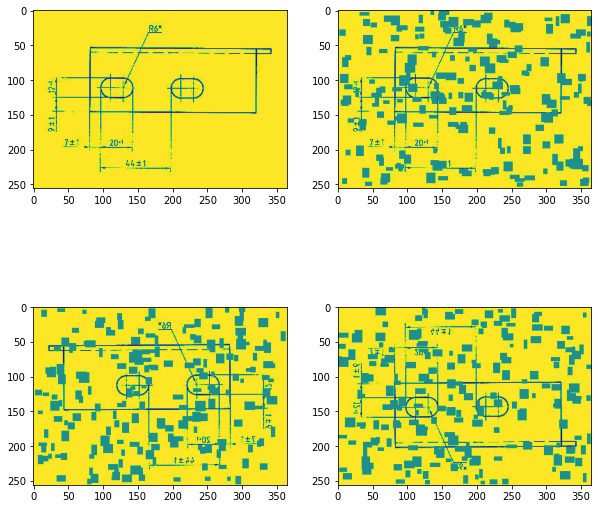

In [87]:
fig, ax = plt.subplots(2, 2, figsize=[10,10])
img_names = list((Path() / 'test' / 'train' / 'projs').glob('*'))
assert len(img_names) == 4

for i, img_name in enumerate(img_names):
    ax[i // 2][i % 2].imshow(Image.open(img_name))
plt.show()

Текущая конфигурация:<br/>
Датасет перемешивается с seed=123<br/>
К каждой картинке из перемешанного датасета применяется фукнция снизу:<br/>
Картинка -> картинка + отражения по вертикали и горизонатли ->
из каждой картинки с предыдущего шага делается 4 новых путем нанесения 200 патчей размера 5-15x5-15<br/>
Итого из каждой картинки получаем 12 новых <br/>
Из маски ничего не вырезается

In [88]:
_, dataloader_train, _, dataloader_test = get_dataloaders_supervised(shuffle_seed=123)

## Loss

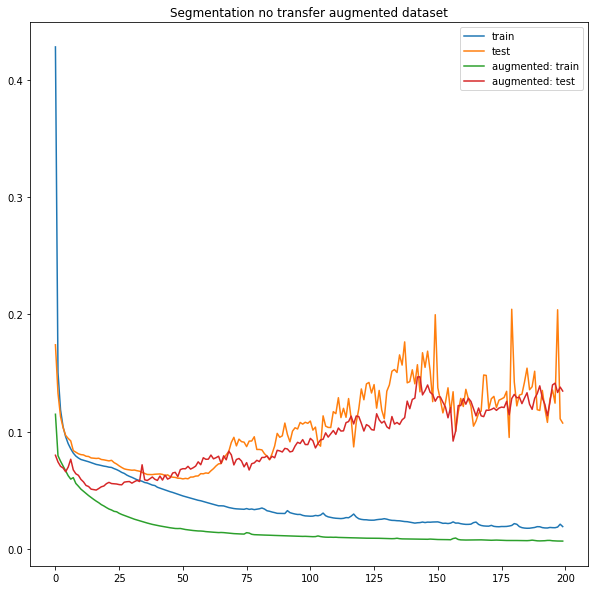

In [89]:
from parse_stats import parse_stats_and_plot

plt.figure(figsize=[10, 10])
plt.title('Segmentation no transfer augmented dataset')
parse_stats_and_plot(str(Path() / 'logs' / 'no_transfer' / '200epochs_1e-4.out'), labels=['train', 'test'])
parse_stats_and_plot(str(Path() / 'logs' / 'no_transfer' / '200_5-15x5-15_x4_drop_initial_vh_shuffle_123' / '200epochs_1e-4.out'), labels=['augmented: train', 'augmented: test'])
plt.legend()
plt.show()

Как видно сообо ничего не получилось<br/>
Лосс на тесте в какой-то момент меньше в аугментированном случае, но переобучение побороть не удалось

## Plot train

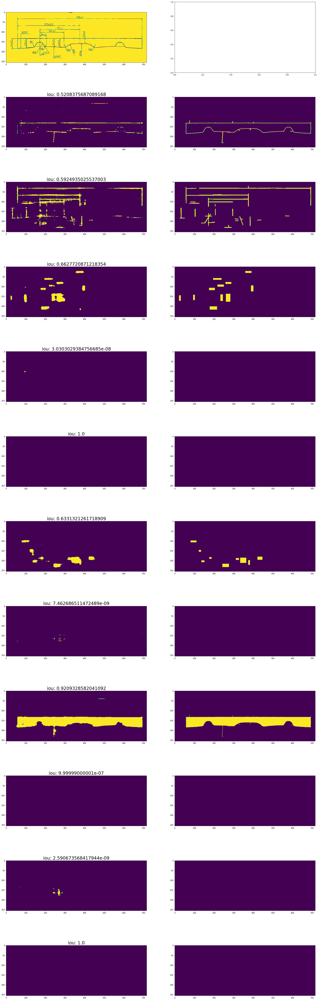

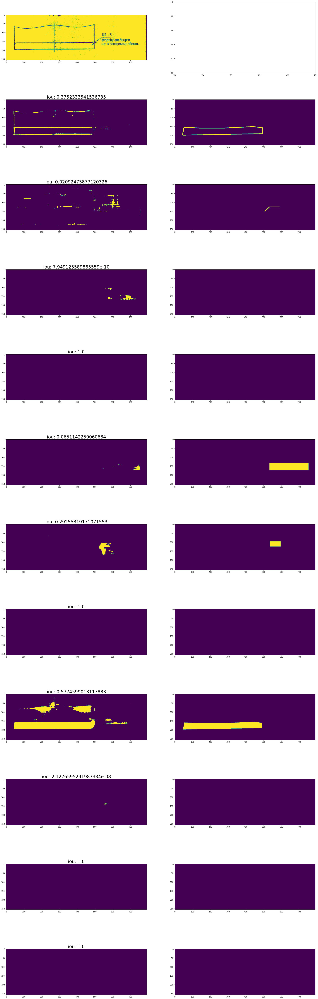

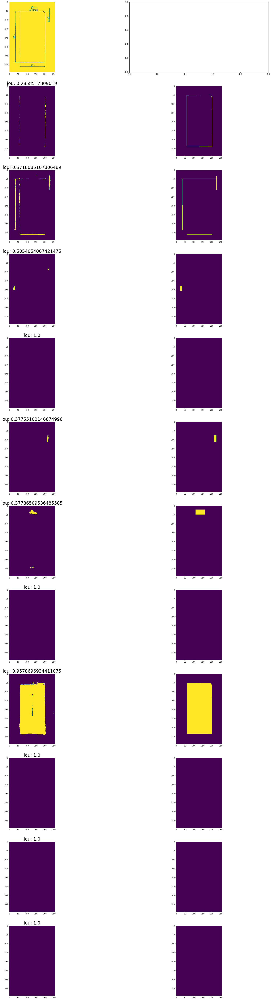

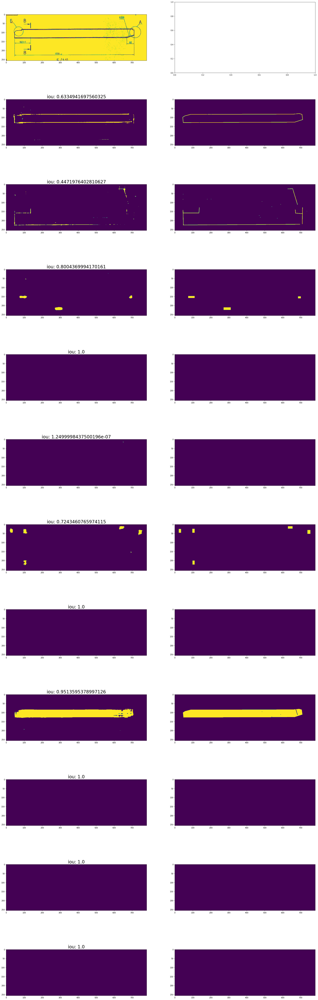

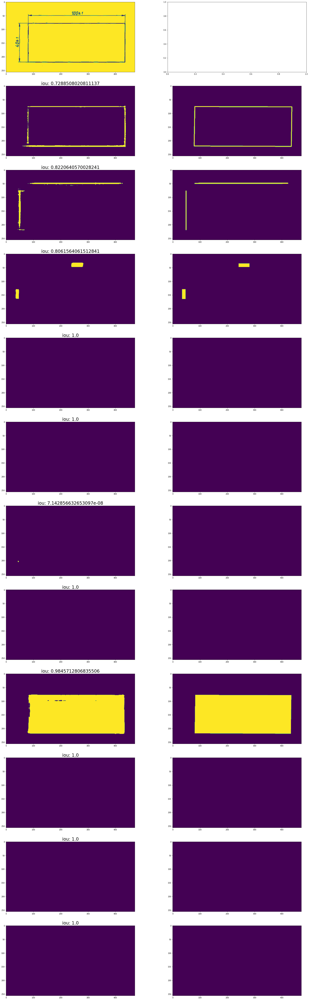

In [90]:
plot_five('learned_models/no_transfer/200_5-15x5-15_x4_drop_initial_vh_shuffle_123/200epochs_1e-4.pt', calc_iou=True, mode='train')

## Plot test

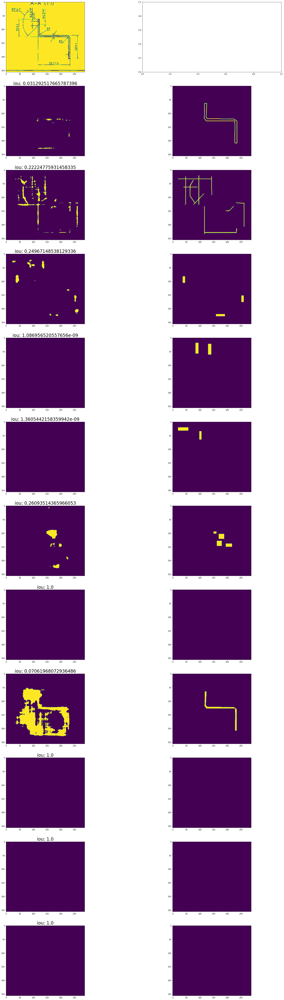

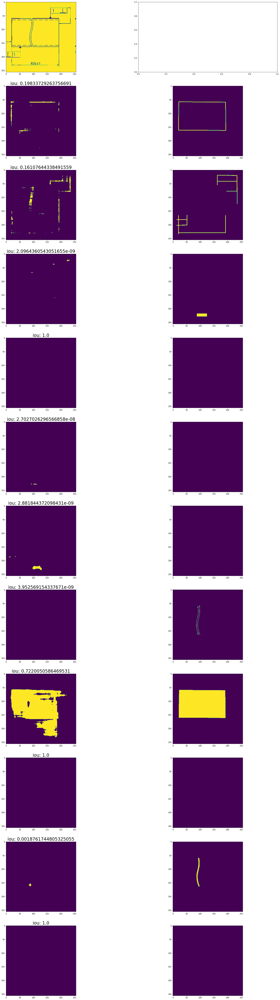

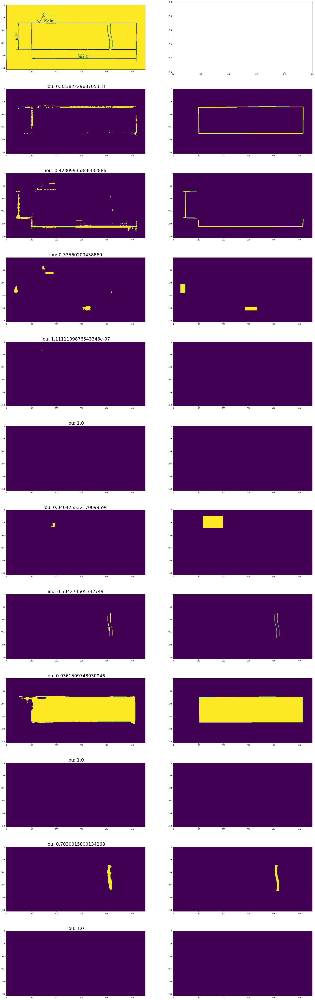

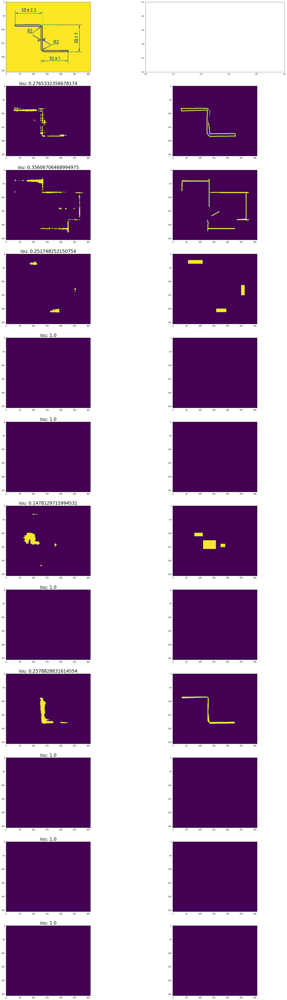

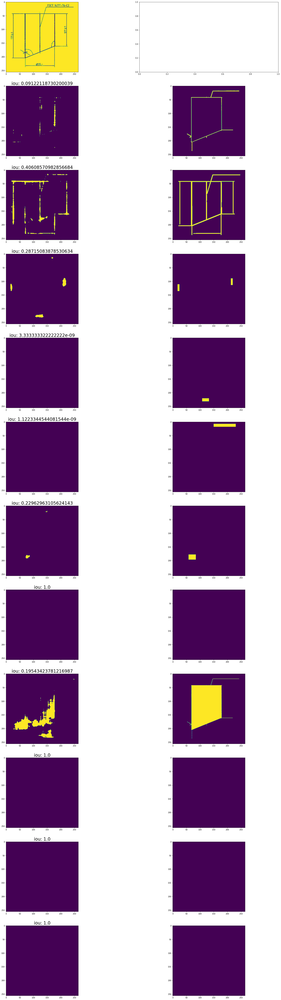

In [91]:
plot_five('learned_models/no_transfer/200_5-15x5-15_x4_drop_initial_vh_shuffle_123/200epochs_1e-4.pt', calc_iou=True, mode='test')

## IOU train

In [92]:
iou_global(dataloader=dataloader_train, model=model, device=device)

array([0.38531044, 0.45773927, 0.54517908, 0.73067462, 0.58829372,
       0.39948133, 0.61043599, 0.69968493, 0.60314012, 0.70349166,
       0.68810711])

## IOU test

In [93]:
iou_global(dataloader_test, model, device)

array([0.20153677, 0.27205627, 0.34522127, 0.55594925, 0.44444448,
       0.13648683, 0.33247357, 0.51085414, 0.77777778, 0.54329887,
       0.83333334])

# Segmentation transfer with skips

In [94]:
_, dataloader_train, _, dataloader_test = get_dataloaders_supervised()

## Loss

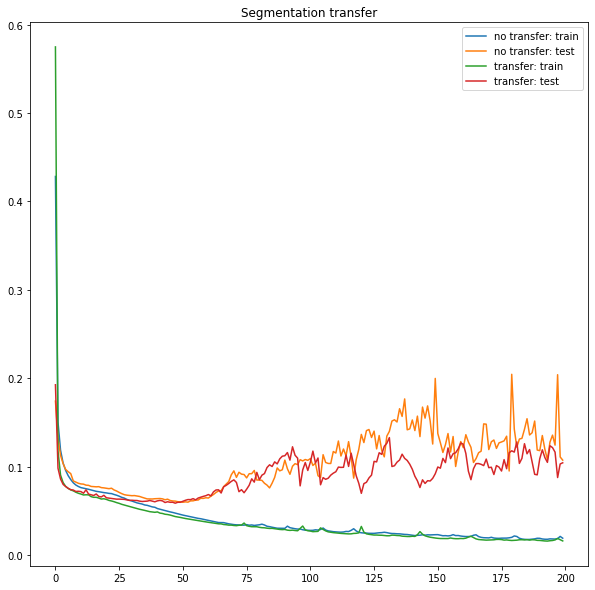

In [95]:
plt.figure(figsize=[10, 10])
plt.title('Segmentation transfer')
parse_stats_and_plot(str(Path() / 'logs' / 'no_transfer' / '200epochs_1e-4.out'), labels=['no transfer: train', 'no transfer: test'])
parse_stats_and_plot(str(Path() / 'logs' / 'transfer' / '200epochs_1e-4.out'), labels=['transfer: train', 'transfer: test'])
plt.legend()
plt.show()

## Plot train

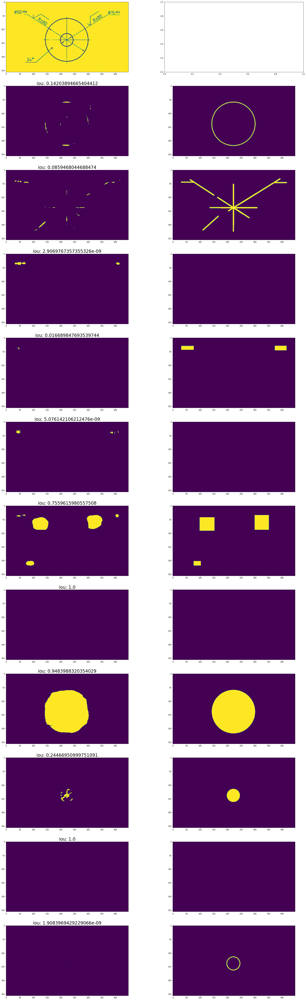

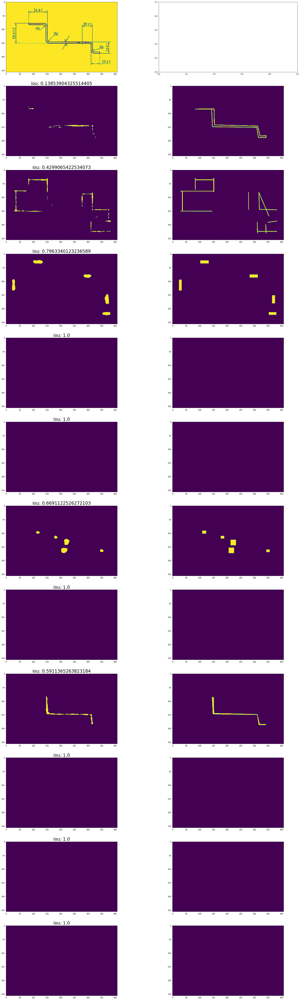

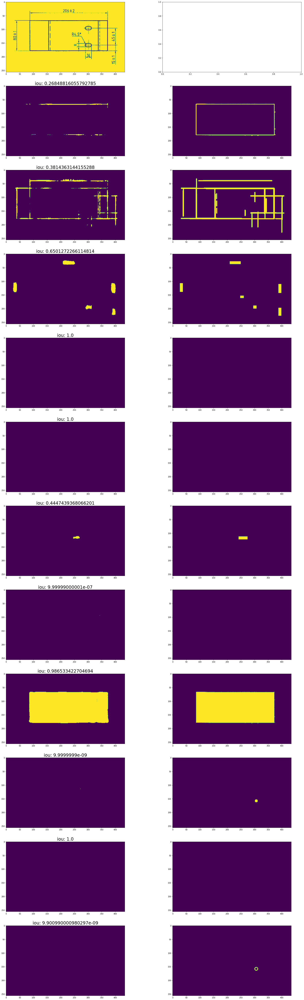

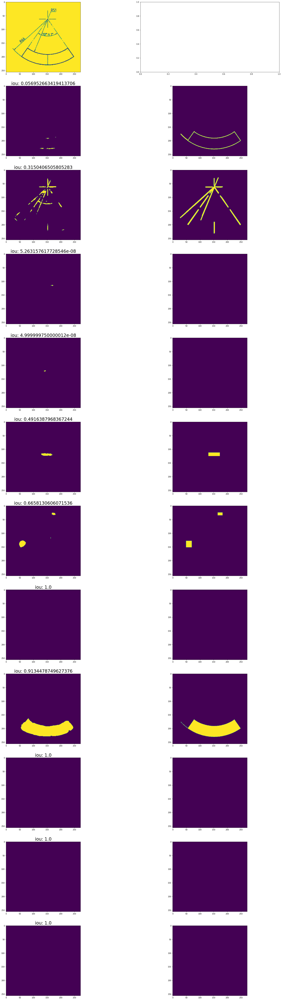

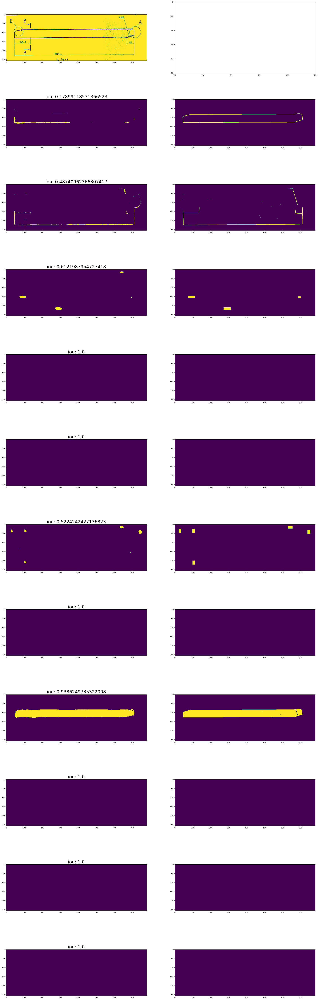

In [96]:
plot_five('learned_models/transfer/200epochs_1e-4.pt', calc_iou=True, mode='train')

## Plot test

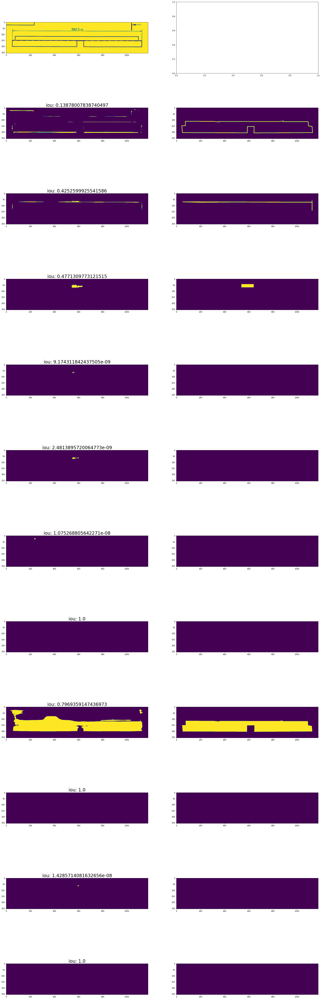

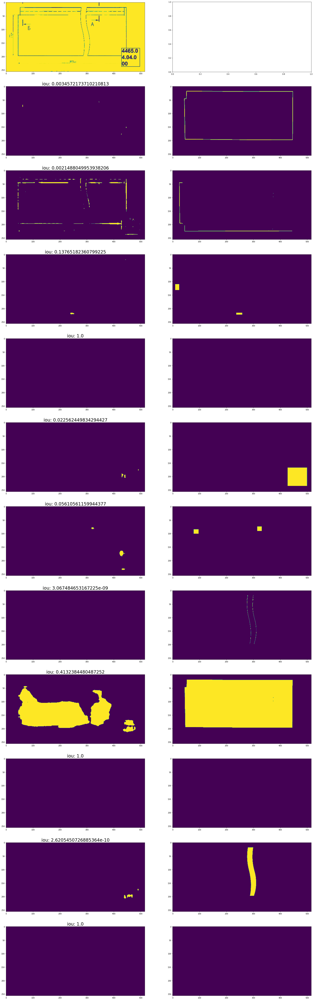

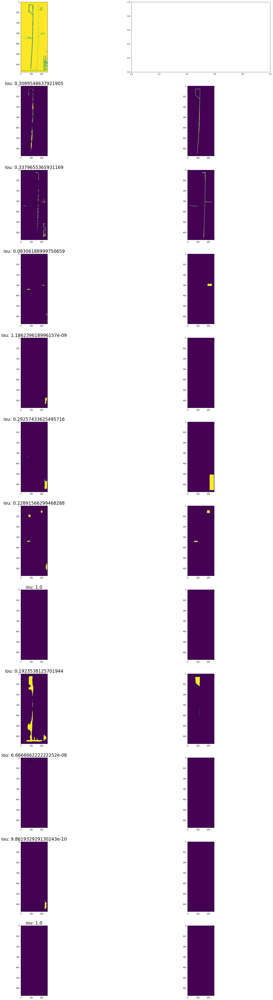

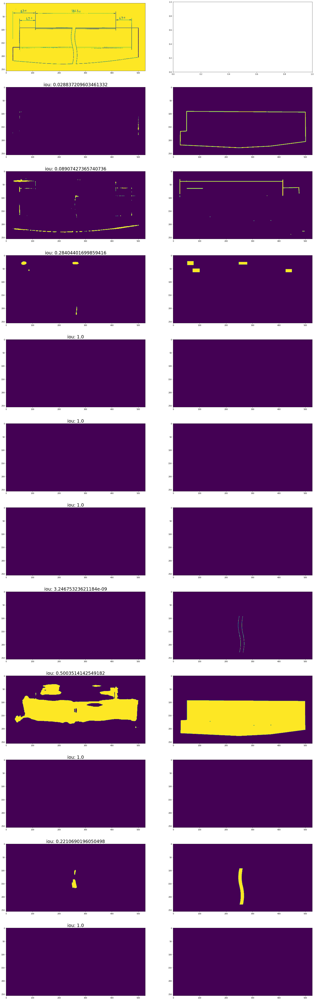

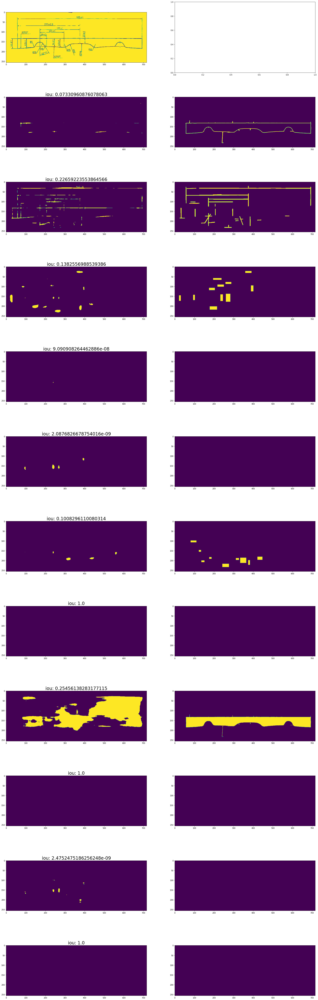

In [97]:
plot_five('learned_models/transfer/200epochs_1e-4.pt', calc_iou=True, mode='test')

## IOU train

In [98]:
iou_global(dataloader=dataloader_train, model=model, device=device)

array([0.24598315, 0.41382376, 0.64918887, 0.74055185, 0.64429339,
       0.62763607, 0.76618407, 0.77061923, 0.81239737, 0.6645531 ,
       0.7591446 ])

## IOU test

In [99]:
iou_global(dataloader_test, model, device)

array([0.15556017, 0.25159324, 0.28856686, 0.61111112, 0.41633714,
       0.33375579, 0.66666668, 0.47849134, 0.61111112, 0.45672606,
       0.66666672])

## Transfer with skips on augmented dataset

In [100]:
_, dataloader_train, _, dataloader_test = get_dataloaders_supervised(shuffle_seed=123)

## Loss

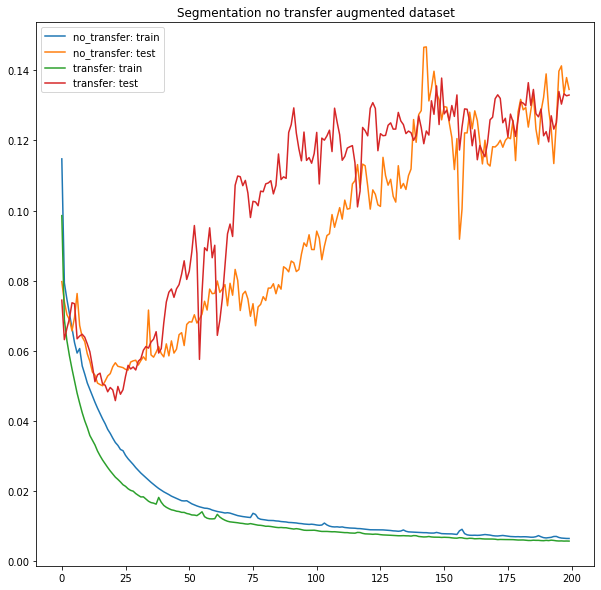

In [101]:
from parse_stats import parse_stats_and_plot

plt.figure(figsize=[10, 10])
plt.title('Segmentation no transfer augmented dataset')
parse_stats_and_plot(str(Path() / 'logs' / 'no_transfer'/ '200_5-15x5-15_x4_drop_initial_vh_shuffle_123' / '200epochs_1e-4.out'), labels=['no_transfer: train', 'no_transfer: test'])
parse_stats_and_plot(str(Path() / 'logs' / 'transfer' / '200_5-15x5-15_x4_drop_initial_vh_shuffle_123' / '200epochs_1e-4_invert.out'), labels=['transfer: train', 'transfer: test'])
plt.legend()
plt.show()

Тут тоже самое<br/>
Лосс на тесте в какой-то момент меньше в случае с трансфером, но переобучение побороть не удается

## Plot train

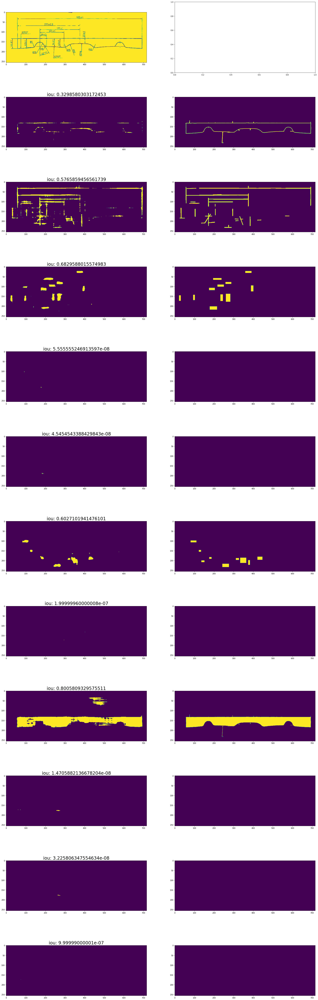

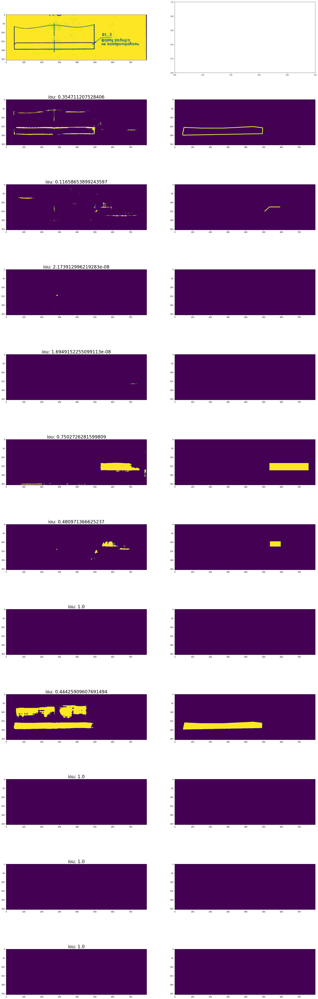

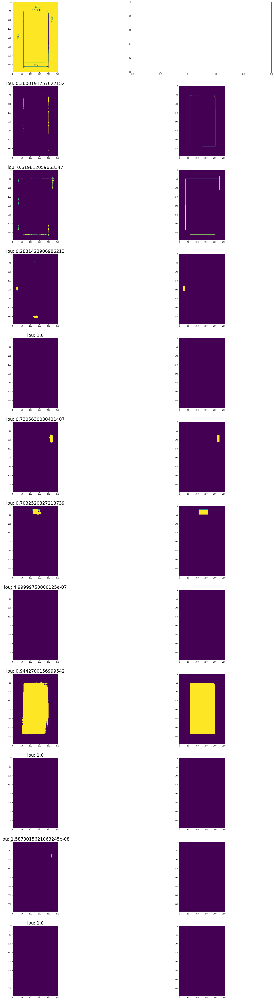

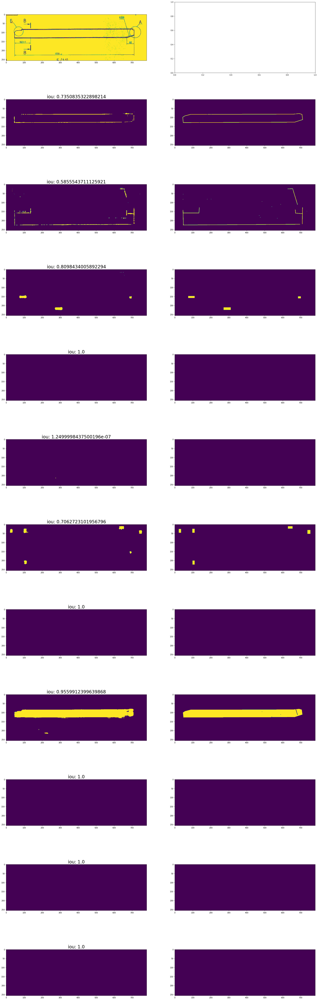

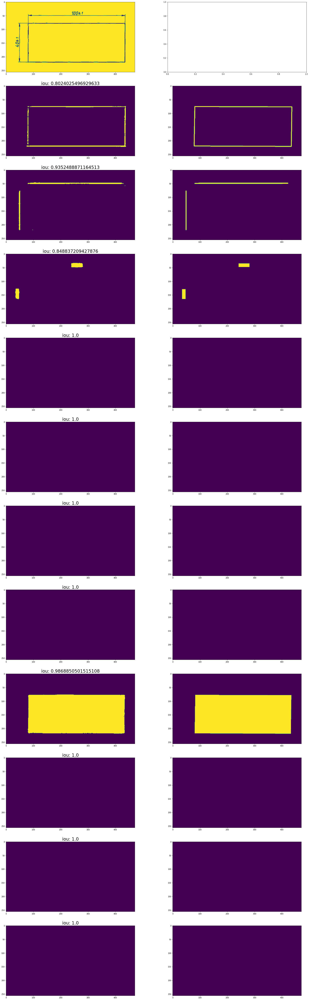

In [102]:
plot_five('learned_models/transfer/200_5-15x5-15_x4_drop_initial_vh_shuffle_123/200epochs_1e-4_invert.pt', calc_iou=True, mode='train')

## Plot test

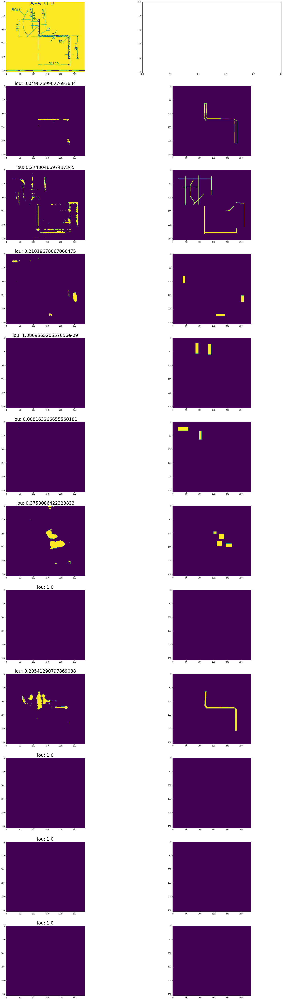

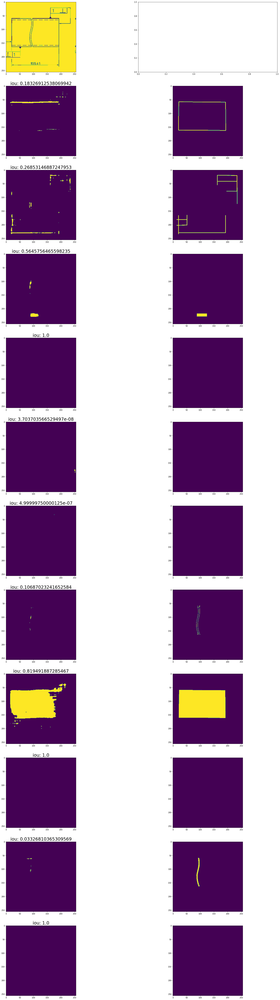

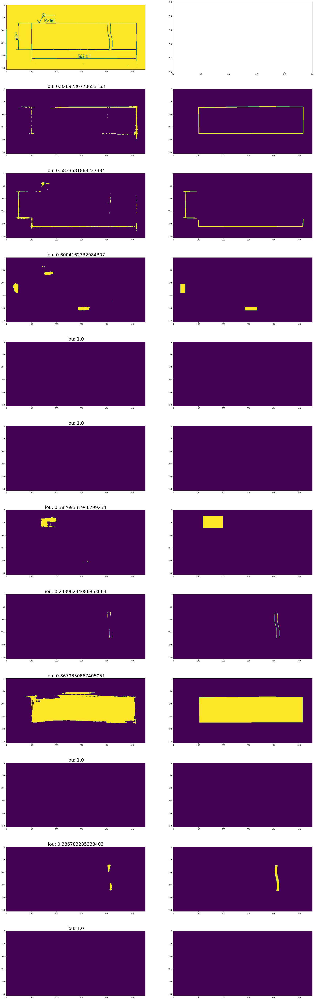

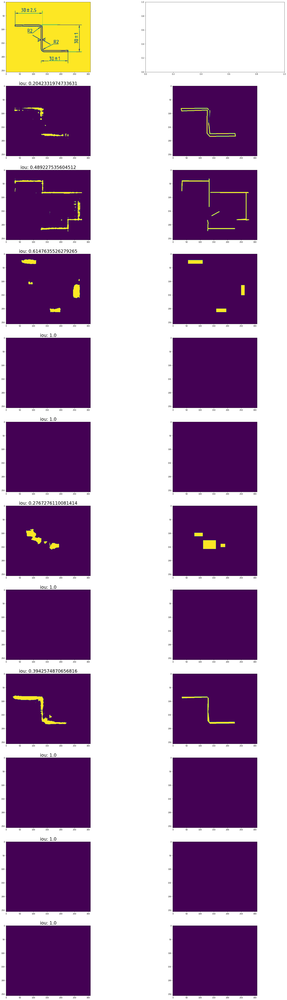

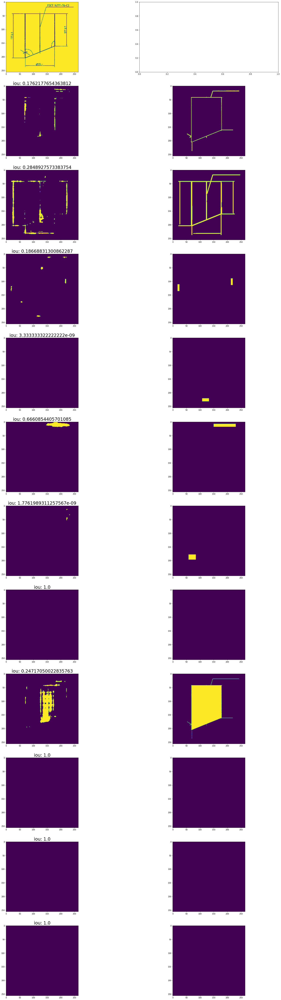

In [103]:
plot_five('learned_models/transfer/200_5-15x5-15_x4_drop_initial_vh_shuffle_123/200epochs_1e-4_invert.pt', calc_iou=True, mode='test')

## IOU train

In [104]:
iou_global(dataloader=dataloader_train, model=model, device=device)

array([0.400538  , 0.49901058, 0.59279443, 0.77171985, 0.5036537 ,
       0.54744946, 0.69973063, 0.71474031, 0.73407951, 0.80225633,
       0.70750125])

## IOU test

In [105]:
iou_global(dataloader_test, model, device)

array([0.21844224, 0.33865396, 0.38220797, 0.83333333, 0.37079162,
       0.21242894, 0.60011578, 0.5494917 , 0.7777778 , 0.60032938,
       0.8920765 ])

# Segmentation no transfer no skips

In [106]:
from unet import SkipType

model = Unet(layers=[8, 16, 32, 64, 128], output_channels=11, skip=SkipType.NO_SKIP).to(device)
_, dataloader_train, _, dataloader_test = get_dataloaders_supervised()

## Loss

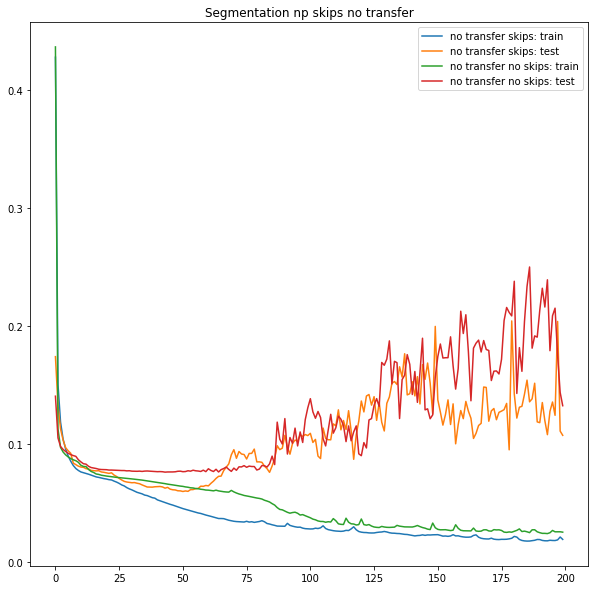

In [107]:
plt.figure(figsize=[10, 10])
plt.title('Segmentation np skips no transfer')
parse_stats_and_plot(str(Path() / 'logs' / 'no_transfer' / '200epochs_1e-4.out'), labels=['no transfer skips: train', 'no transfer skips: test'])
parse_stats_and_plot(str(Path() / 'logs' / 'no_transfer' / 'no_skip' / '200epochs_1e-4.out'), labels=['no transfer no skips: train', 'no transfer no skips: test'])
plt.legend()
plt.show()

## Plot train

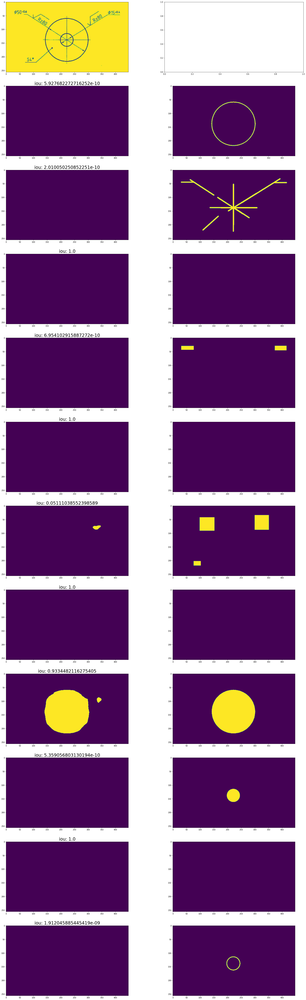

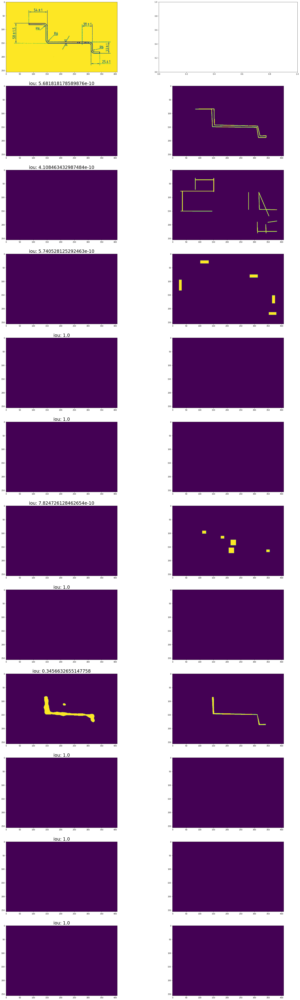

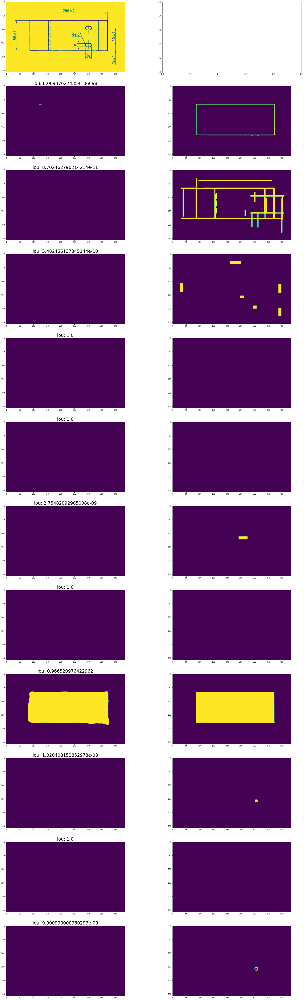

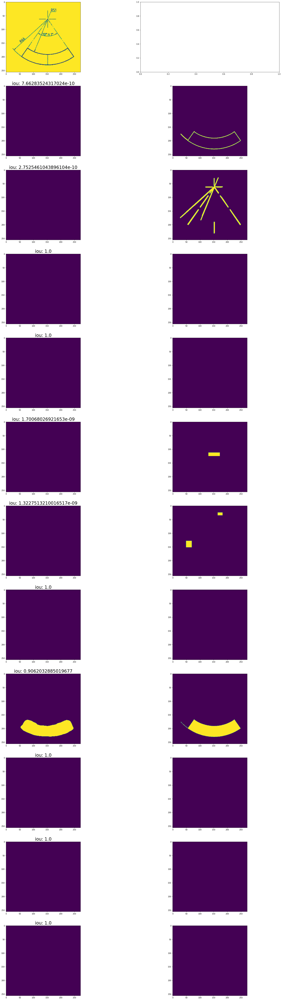

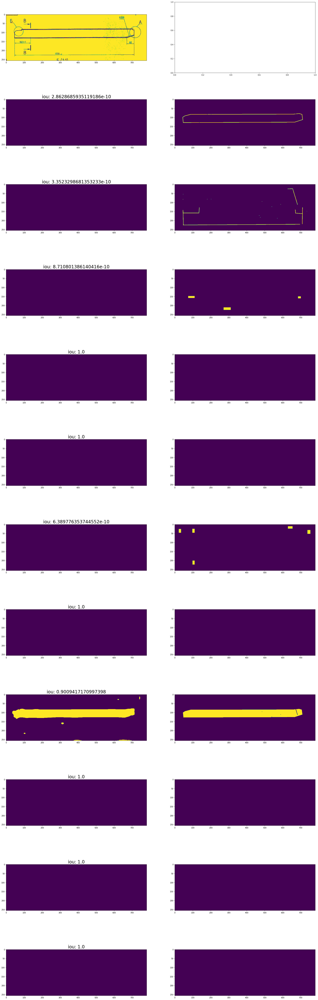

In [108]:
plot_five('learned_models/no_transfer/no_skip/200epochs_1e-4.pt', calc_iou=True, mode='train')

## Plot test

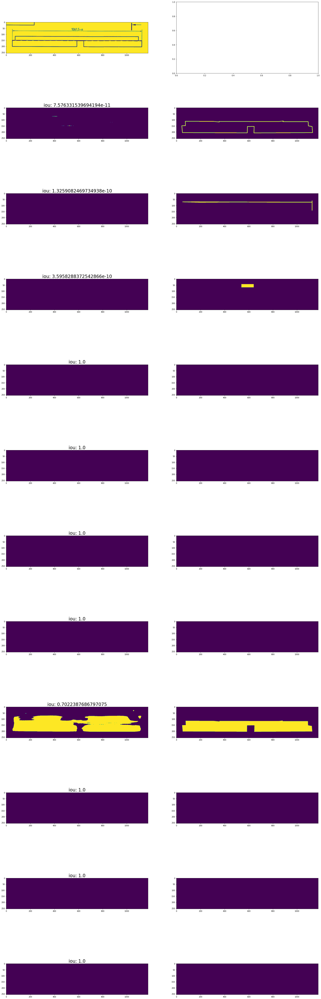

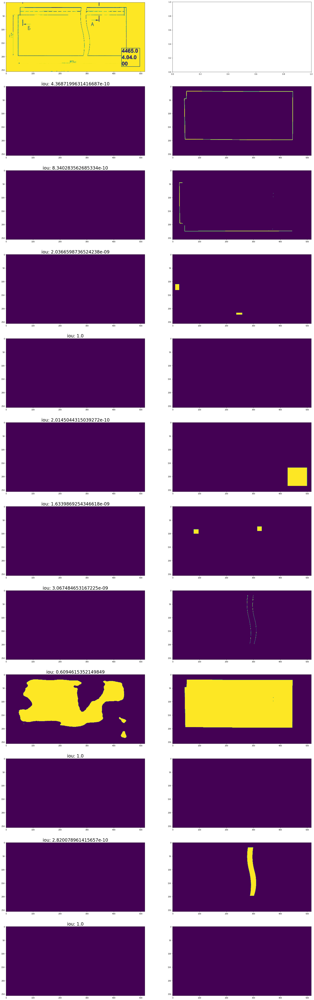

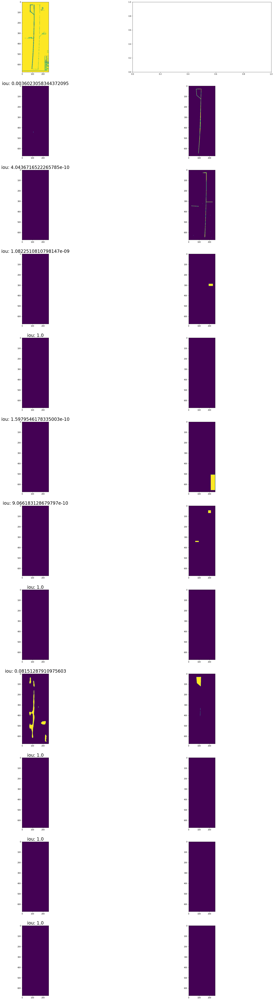

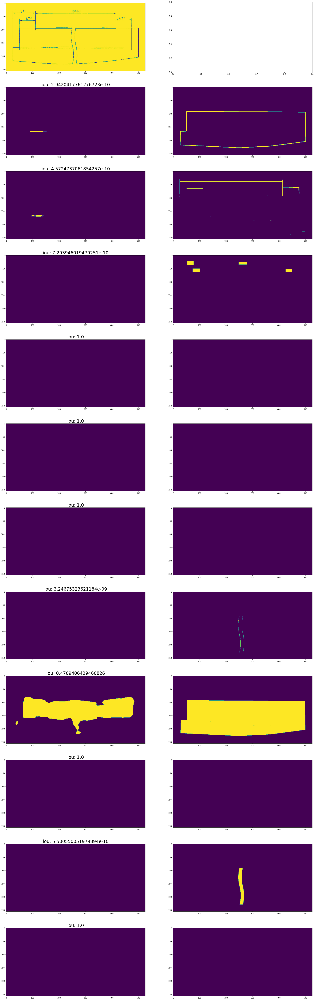

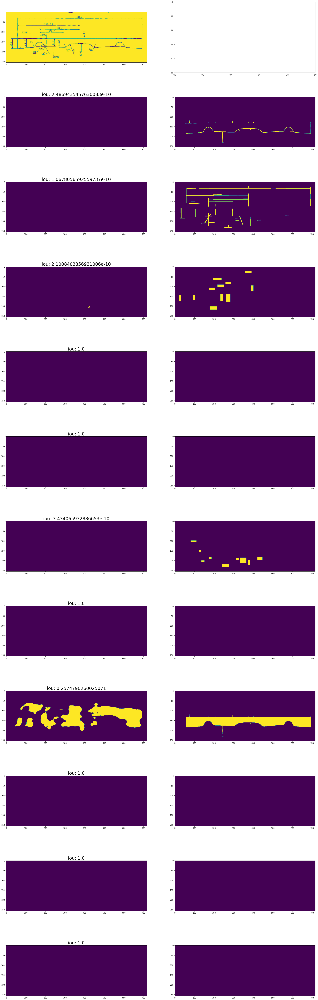

In [109]:
plot_five('learned_models/no_transfer/no_skip/200epochs_1e-4.pt', calc_iou=True, mode='test')

## IOU train

In [110]:
iou_global(dataloader=dataloader_train, model=model, device=device)

array([0.00407953, 0.02225629, 0.10611308, 0.85365854, 0.58536585,
       0.14974156, 0.77439025, 0.72759098, 0.81372484, 0.76835735,
       0.77439025])

## IOU test

In [111]:
iou_global(dataloader_test, model, device)

array([1.85192884e-03, 6.14576426e-04, 2.21833562e-02, 8.33333334e-01,
       6.66666667e-01, 2.80231628e-01, 7.77777779e-01, 4.67929748e-01,
       6.11111113e-01, 7.77777779e-01, 7.22222223e-01])

# Segmentation transfer no skips

In [112]:
from unet import SkipType

model = Unet(layers=[8, 16, 32, 64, 128], output_channels=11, skip=SkipType.NO_SKIP).to(device)
_, dataloader_train, _, dataloader_test = get_dataloaders_supervised()

## Loss

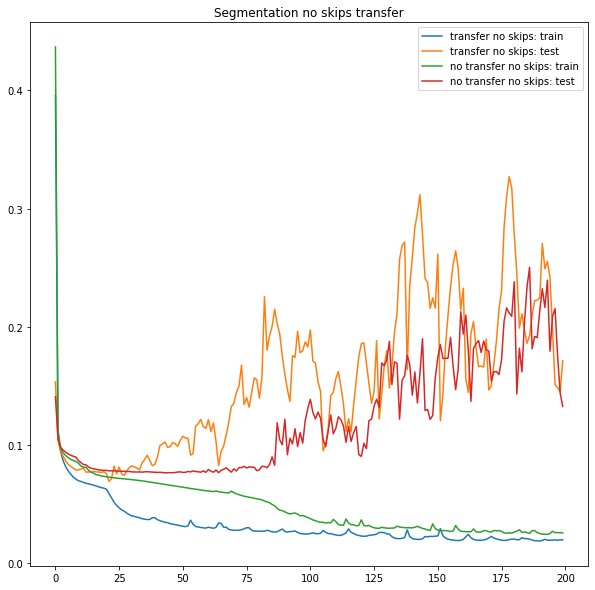

In [113]:
plt.figure(figsize=[10, 10])
plt.title('Segmentation no skips transfer')
parse_stats_and_plot(str(Path() / 'logs' / 'no_skip' / 'segmentation' / '200epochs_1e-4.out'), labels=['transfer no skips: train', 'transfer no skips: test'])
parse_stats_and_plot(str(Path() / 'logs' / 'no_transfer' / 'no_skip' / '200epochs_1e-4.out'), labels=['no transfer no skips: train', 'no transfer no skips: test'])
plt.legend()
plt.show()

## Plot train

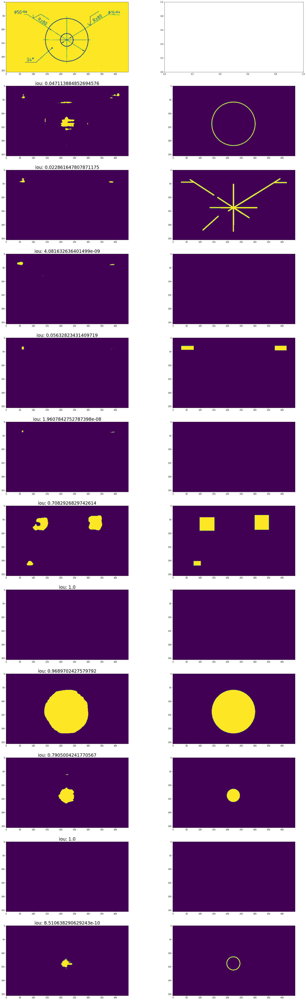

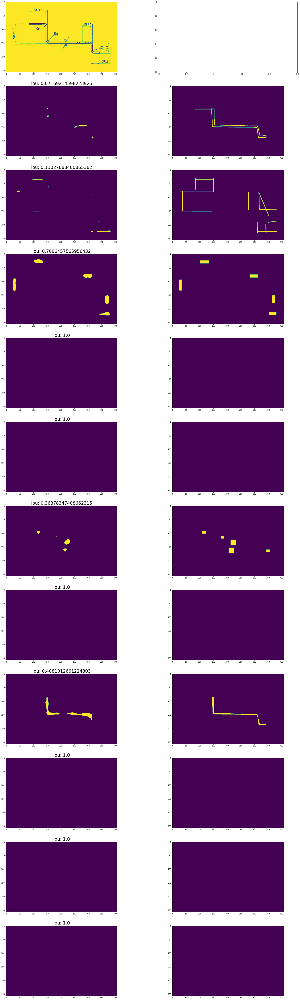

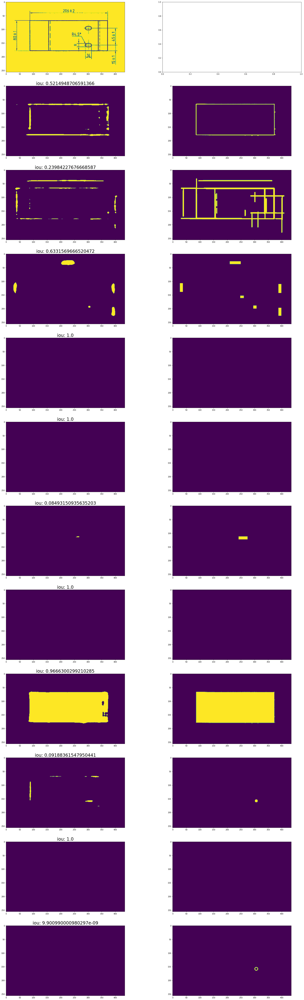

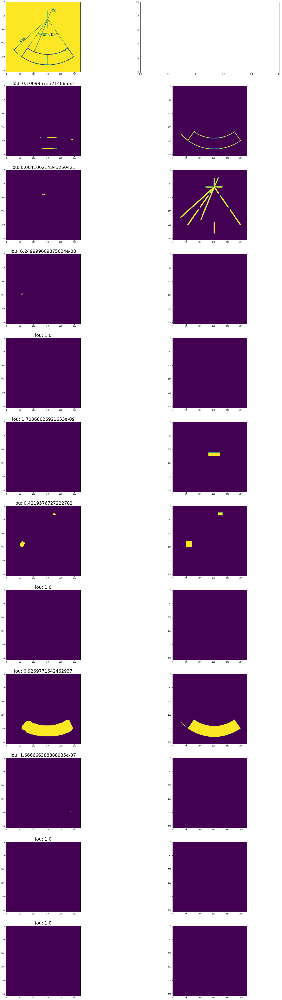

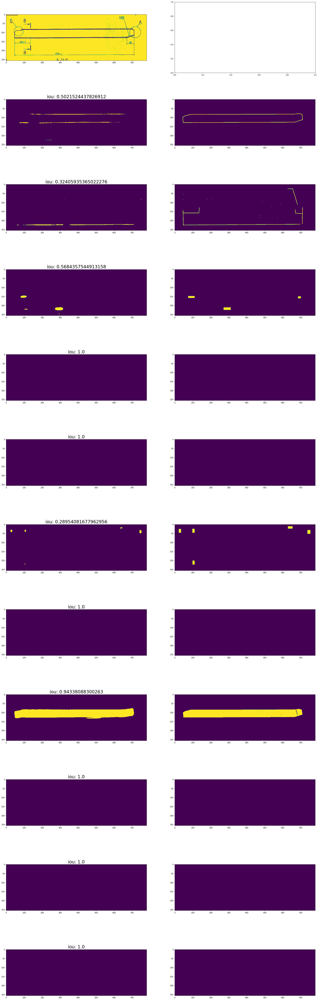

In [114]:
plot_five('learned_models/no_skip/segmentation/200epochs_1e-4.pt', calc_iou=True, mode='train')

## Plot test

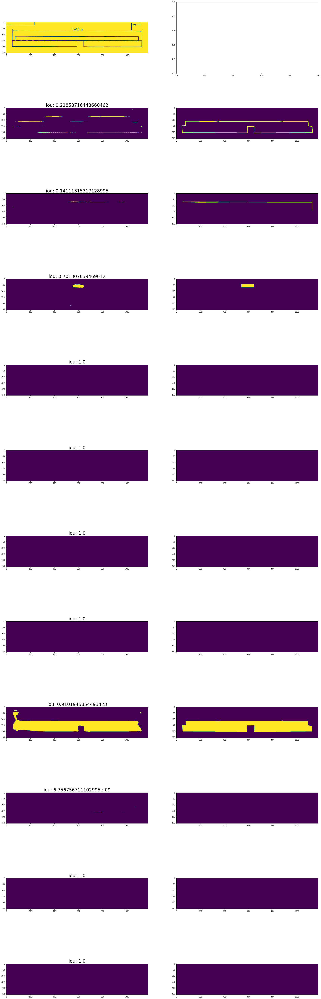

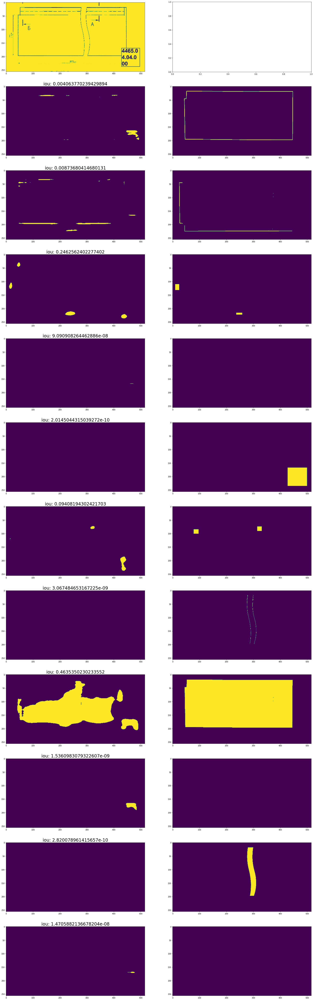

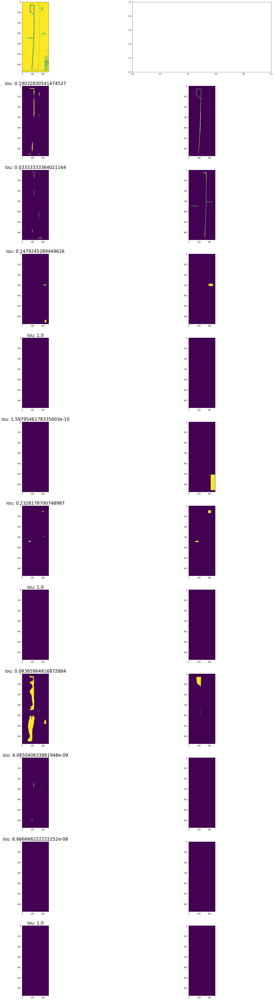

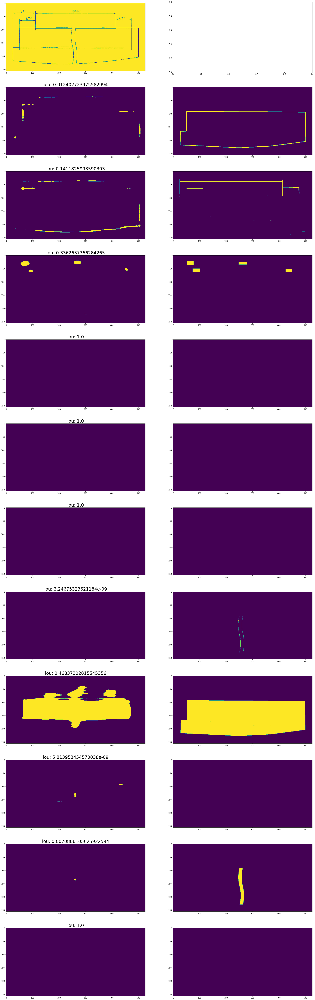

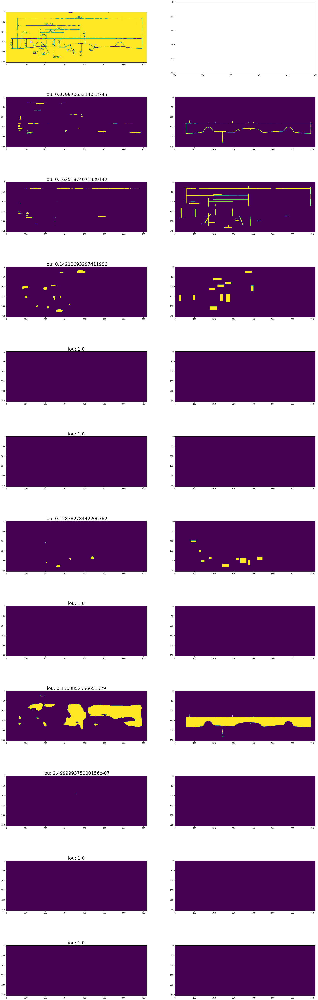

In [115]:
plot_five('learned_models/no_skip/segmentation/200epochs_1e-4.pt', calc_iou=True, mode='test')

## IOU train

In [116]:
iou_global(dataloader=dataloader_train, model=model, device=device)

array([0.26613737, 0.25892244, 0.54737156, 0.83049155, 0.50187066,
       0.55212641, 0.76832168, 0.77119123, 0.48427726, 0.71834768,
       0.74467767])

## IOU test

In [117]:
iou_global(dataloader_test, model, device)


array([0.13286574, 0.09875381, 0.28357905, 0.72222223, 0.61111111,
       0.24728972, 0.77777778, 0.41306891, 0.11111114, 0.61150449,
       0.66666667])